# PART 0: Introduction & Setup

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
from glob import glob
from tqdm import tqdm
import time

from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, Model
from tensorflow.keras.applications import ResNet50, MobileNetV2
from tensorflow.keras.callbacks import (
    ModelCheckpoint, 
    EarlyStopping, 
    ReduceLROnPlateau,
    TensorBoard
)

np.random.seed(42)
tf.random.set_seed(42)

print("TensorFlow version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))
if tf.config.list_physical_devices('GPU'):
    print("GPU Name:", tf.test.gpu_device_name())

CONFIG = {
    'DATA_PATH': 'path/to/massachusetts-roads-dataset',
    'IMG_HEIGHT': 256,
    'IMG_WIDTH': 256,
    'IMG_CHANNELS': 3,

    'BATCH_SIZE': 16,
    'EPOCHS': 10,
    'LEARNING_RATE': 0.001,
    'VALIDATION_SPLIT': 0.2,

    'USE_AUGMENTATION': True,

    'SAVE_DIR': 'models/',
    'RESULTS_DIR': 'results/'
}

os.makedirs(CONFIG['SAVE_DIR'], exist_ok=True)
os.makedirs(CONFIG['RESULTS_DIR'], exist_ok=True)

print("\nConfiguration loaded successfully!")

TensorFlow version: 2.20.0
GPU Available: []

Configuration loaded successfully!


# PART 1: Data Loading & Preprocessing

## Section 1.1: Load Dataset

In [ ]:
import os
from pathlib import Path

DATASET_NAME = 'balraj98/massachusetts-roads-dataset'
DATA_DIR = 'massachusetts-roads-dataset'

if not os.path.exists(DATA_DIR):
    print("📦 Downloading dataset from Kaggle...")

    os.system(f'kaggle datasets download -d {DATASET_NAME}')
    
    print("📂 Extracting dataset...")

    os.system(f'unzip -q massachusetts-roads-dataset.zip -d {DATA_DIR}')
    

    os.system('rm massachusetts-roads-dataset.zip')
    
    print("✅ Dataset ready!")
else:
    print("✅ Dataset already exists, skipping download.")


CONFIG['DATA_PATH'] = DATA_DIR

print(f"\n📁 Dataset structure:")
for root, dirs, files in os.walk(DATA_DIR):
    level = root.replace(DATA_DIR, '').count(os.sep)
    indent = ' ' * 2 * level
    print(f'{indent}{os.path.basename(root)}/')
    if level < 2:
        subindent = ' ' * 2 * (level + 1)
        for file in files[:3]:
            print(f'{subindent}{file}')
        if len(files) > 3:
            print(f'{subindent}... and {len(files)-3} more files')

📦 Downloading dataset from Kaggle...
Dataset URL: https://www.kaggle.com/datasets/balraj98/massachusetts-roads-dataset
License(s): other


100%|██████████████████████████████████████| 5.76G/5.76G [00:35<00:00, 174MB/s]



📂 Extracting dataset...
✅ Dataset ready!

📁 Dataset structure:
massachusetts-roads-dataset/
  metadata.csv
  label_class_dict.csv
  tiff/
    val_labels/
    test_labels/
    test/
    train_labels/
    train/
    val/


In [ ]:
def load_dataset(data_path, img_size=(256, 256)):
    """
    Load Massachusetts Roads Dataset (TIFF format)
    Returns: images, masks, filenames
    """
    train_img_dir = os.path.join(data_path, 'tiff', 'train')
    train_mask_dir = os.path.join(data_path, 'tiff', 'train_labels')
    
    image_files = sorted(glob(os.path.join(train_img_dir, '*.tiff')))
    
    if len(image_files) == 0:
        print(f"❌ No images found in {train_img_dir}")
        return np.array([]), np.array([]), []
    
    print(f"Found {len(image_files)} training images")
    
    images = []
    masks = []
    filenames = []
    
    print("\nLoading dataset...")
    for img_path in tqdm(image_files):

        filename = os.path.basename(img_path)

        mask_filename = filename.replace('.tiff', '.tif')
        mask_path = os.path.join(train_mask_dir, mask_filename)
        

        if not os.path.exists(mask_path):
            print(f"⚠️  Mask not found: {mask_filename}, skipping...")
            continue
        

        img = cv2.imread(img_path)
        if img is None:
            print(f"⚠️  Could not load {filename}, skipping...")
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, img_size, interpolation=cv2.INTER_AREA)
        

        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            print(f"⚠️  Could not load mask for {filename}, skipping...")
            continue
        mask = cv2.resize(mask, img_size, interpolation=cv2.INTER_NEAREST)
        
        images.append(img)
        masks.append(mask)
        filenames.append(filename)
    
    images = np.array(images, dtype=np.float32)
    masks = np.array(masks, dtype=np.float32)
    
    return images, masks, filenames


images, masks, filenames = load_dataset(
    CONFIG['DATA_PATH'], 
    (CONFIG['IMG_HEIGHT'], CONFIG['IMG_WIDTH'])
)

print(f"\n✅ Dataset loaded!")
print(f"Images shape: {images.shape}")
print(f"Masks shape: {masks.shape}")

if len(images) > 0:
    print(f"Image dtype: {images.dtype}")
    print(f"Image range: [{images.min()}, {images.max()}]")
    print(f"Mask unique values: {np.unique(masks)}")
else:
    print("❌ No images were loaded!")

Found 1108 training images

Loading dataset...


100%|██████████| 1108/1108 [00:31<00:00, 34.70it/s]



✅ Dataset loaded!
Images shape: (1108, 256, 256, 3)
Masks shape: (1108, 256, 256)
Image dtype: float32
Image range: [0.0, 255.0]
Mask unique values: [  0. 255.]


## Section 1.2: Preprocessing


In [ ]:
# Normalize images to [0, 1]
images_normalized = images / 255.0

# Binarize masks (threshold at 127)
masks_binary = (masks > 127).astype(np.float32)

# Expand masks dimension for model compatibility
masks_binary_expanded = np.expand_dims(masks_binary, axis=-1)

print("Preprocessing complete:")
print(f"Images range: [{images_normalized.min():.3f}, {images_normalized.max():.3f}]")
print(f"Masks shape: {masks_binary_expanded.shape}")
print(f"Masks unique values: {np.unique(masks_binary_expanded)}")

# Calculate class distribution
total_pixels = masks_binary.size
road_pixels = masks_binary.sum()
background_pixels = total_pixels - road_pixels

print(f"\nPixel Distribution:")
print(f"  Road: {road_pixels:,} ({road_pixels/total_pixels*100:.2f}%)")
print(f"  Background: {background_pixels:,} ({background_pixels/total_pixels*100:.2f}%)")
print(f"  Imbalance ratio: {background_pixels/road_pixels:.1f}:1")

Preprocessing complete:
Images range: [0.000, 1.000]
Masks shape: (1108, 256, 256, 1)
Masks unique values: [0. 1.]

Pixel Distribution:
  Road: 3,462,044.0 (4.77%)
  Background: 69,151,840.0 (95.23%)
  Imbalance ratio: 20.0:1


# PART 2: Exploratory Data Analysis

## Section 2.1: Visual Exploration

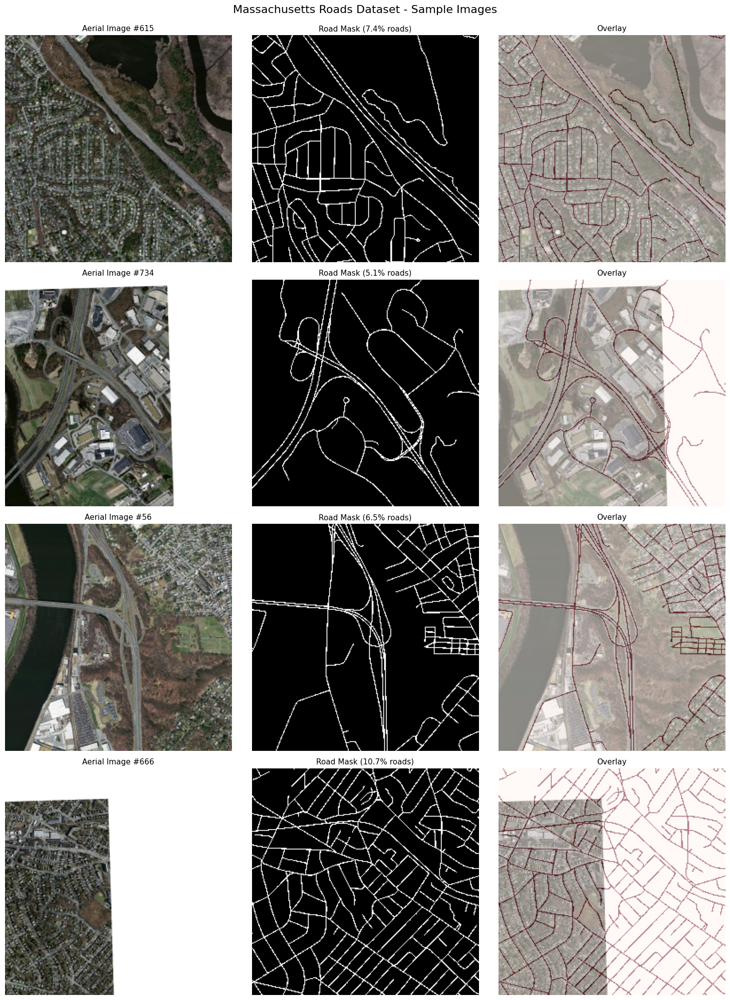

In [ ]:
fig, axes = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Massachusetts Roads Dataset - Sample Images', fontsize=16, y=0.995)

indices = np.random.choice(len(images), 4, replace=False)

for i, idx in enumerate(indices):
    axes[i, 0].imshow(images_normalized[idx])
    axes[i, 0].set_title(f'Aerial Image #{idx}', fontsize=11)
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(masks_binary[idx], cmap='gray')
    road_pct = masks_binary[idx].mean() * 100
    axes[i, 1].set_title(f'Road Mask ({road_pct:.1f}% roads)', fontsize=11)
    axes[i, 1].axis('off')
    
    axes[i, 2].imshow(images_normalized[idx])
    axes[i, 2].imshow(masks_binary[idx], alpha=0.5, cmap='Reds')
    axes[i, 2].set_title('Overlay', fontsize=11)
    axes[i, 2].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(CONFIG['RESULTS_DIR'], 'dataset_samples.png'), dpi=150, bbox_inches='tight')
plt.show()

## Section 2.2: Road Density Analysis

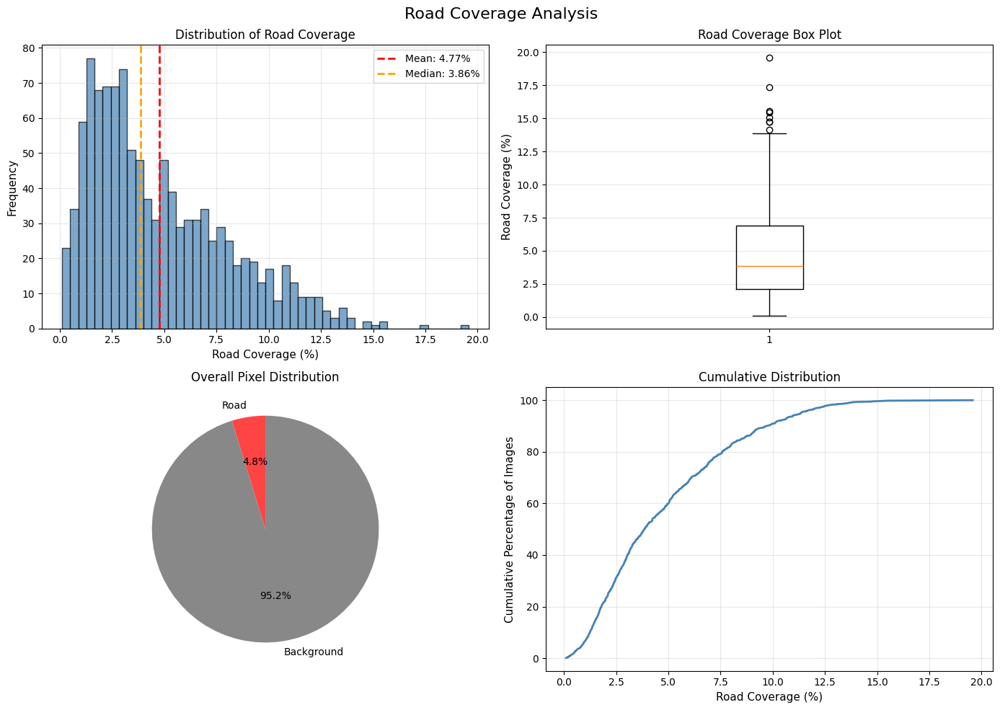

Road Coverage Statistics:
  Mean: 4.77%
  Median: 3.86%
  Std Dev: 3.32%
  Min: 0.11%
  Max: 19.57%


In [49]:
# Calculate road percentage for each image
road_percentages = []
for mask in masks_binary:
    road_pct = mask.mean() * 100
    road_percentages.append(road_pct)

road_percentages = np.array(road_percentages)

# Visualizations
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Road Coverage Analysis', fontsize=16)

# Histogram
axes[0, 0].hist(road_percentages, bins=50, edgecolor='black', alpha=0.7, color='steelblue')
axes[0, 0].axvline(road_percentages.mean(), color='red', linestyle='--', 
                   linewidth=2, label=f'Mean: {road_percentages.mean():.2f}%')
axes[0, 0].axvline(np.median(road_percentages), color='orange', linestyle='--', 
                   linewidth=2, label=f'Median: {np.median(road_percentages):.2f}%')
axes[0, 0].set_xlabel('Road Coverage (%)', fontsize=11)
axes[0, 0].set_ylabel('Frequency', fontsize=11)
axes[0, 0].set_title('Distribution of Road Coverage', fontsize=12)
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# Box plot
axes[0, 1].boxplot(road_percentages, vert=True)
axes[0, 1].set_ylabel('Road Coverage (%)', fontsize=11)
axes[0, 1].set_title('Road Coverage Box Plot', fontsize=12)
axes[0, 1].grid(alpha=0.3, axis='y')

# Pie chart - Overall pixel distribution
axes[1, 0].pie([road_pixels, background_pixels], 
               labels=['Road', 'Background'],
               autopct='%1.1f%%',
               colors=['#ff4444', '#888888'],
               startangle=90)
axes[1, 0].set_title('Overall Pixel Distribution', fontsize=12)

# Cumulative distribution
sorted_percentages = np.sort(road_percentages)
cumulative = np.arange(1, len(sorted_percentages) + 1) / len(sorted_percentages) * 100
axes[1, 1].plot(sorted_percentages, cumulative, linewidth=2, color='steelblue')
axes[1, 1].set_xlabel('Road Coverage (%)', fontsize=11)
axes[1, 1].set_ylabel('Cumulative Percentage of Images', fontsize=11)
axes[1, 1].set_title('Cumulative Distribution', fontsize=12)
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(CONFIG['RESULTS_DIR'], 'road_coverage_analysis.png'), dpi=150, bbox_inches='tight')
plt.show()

print("Road Coverage Statistics:")
print(f"  Mean: {road_percentages.mean():.2f}%")
print(f"  Median: {np.median(road_percentages):.2f}%")
print(f"  Std Dev: {road_percentages.std():.2f}%")
print(f"  Min: {road_percentages.min():.2f}%")
print(f"  Max: {road_percentages.max():.2f}%")

## Section 2.3: Image Characteristics

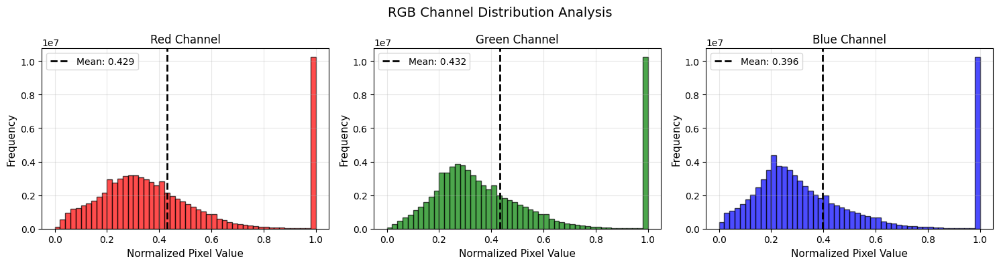

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
fig.suptitle('RGB Channel Distribution Analysis', fontsize=14)

colors = ['red', 'green', 'blue']
channel_names = ['Red', 'Green', 'Blue']

for i in range(3):
    channel_data = images_normalized[:, :, :, i].flatten()
    
    axes[i].hist(channel_data, bins=50, color=colors[i], alpha=0.7, edgecolor='black')
    axes[i].axvline(channel_data.mean(), color='black', linestyle='--', 
                    linewidth=2, label=f'Mean: {channel_data.mean():.3f}')
    axes[i].set_xlabel('Normalized Pixel Value', fontsize=11)
    axes[i].set_ylabel('Frequency', fontsize=11)
    axes[i].set_title(f'{channel_names[i]} Channel', fontsize=12)
    axes[i].legend()
    axes[i].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(CONFIG['RESULTS_DIR'], 'rgb_analysis.png'), dpi=150, bbox_inches='tight')
plt.show()

## Section 2.4: Key Insights

### 📊 Principais Descobertas da EDA

1. **Desbalanceamento Severo de Classes**: Estradas = 4,77%, Fundo = 95,23% (razão 20:1)
   - Acurácia NÃO é adequada → Usar IoU e Coeficiente Dice

2. **Alta Variabilidade**: Cobertura de estradas varia de 0,11% a 19,57% (média: 4,77%, mediana: 3,86%)
   - Dataset inclui cenas diversas (rural → urbano denso)

3. **Análise RGB**: Leve predominância dos canais verde/vermelho (0,43) sobre azul (0,40)
   - Forte presença de pixels claros (estradas pavimentadas, concreto)

4. **Qualidade dos Dados**: 1.108 imagens limpas e bem alinhadas com máscaras binárias

5. **Implicações para Treinamento**:
   - Usar Combined Loss (BCE + Dice) ou Focal Loss
   - Arquiteturas com skip connections (U-Net) essenciais para detalhes finos
   - Data augmentation crítico devido ao tamanho limitado do dataset

# PART 3: Train/Validation Split

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    images_normalized,
    masks_binary_expanded,
    test_size=CONFIG['VALIDATION_SPLIT'],
    random_state=42
)

print("Data Split:")
print(f"  Training samples: {len(X_train)}")
print(f"  Validation samples: {len(X_val)}")
print(f"  Train/Val ratio: {len(X_train)/len(X_val):.1f}:1")
print(f"\nTraining set shape: {X_train.shape}")
print(f"Validation set shape: {X_val.shape}")

train_road_pct = y_train.mean() * 100
val_road_pct = y_val.mean() * 100
print(f"\nRoad percentage - Train: {train_road_pct:.2f}%, Val: {val_road_pct:.2f}%")

Data Split:
  Training samples: 886
  Validation samples: 222
  Train/Val ratio: 4.0:1

Training set shape: (886, 256, 256, 3)
Validation set shape: (222, 256, 256, 3)

Road percentage - Train: 4.80%, Val: 4.62%


# PART 4: Define Metrics & Loss Functions

In [55]:
# Custom metrics for segmentation
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    """
    Dice Coefficient (F1 Score for segmentation)
    Range: [0, 1], higher is better
    """
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (
        tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth
    )

def iou_score(y_true, y_pred, smooth=1e-6):
    """
    Intersection over Union (Jaccard Index)
    Range: [0, 1], higher is better
    """
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    union = tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

def dice_loss(y_true, y_pred):
    """
    Dice Loss = 1 - Dice Coefficient
    Better than BCE for imbalanced segmentation
    """
    return 1 - dice_coefficient(y_true, y_pred)

def combined_loss(y_true, y_pred):
    """
    Combined Binary Crossentropy + Dice Loss
    BCE: penalizes wrong predictions
    Dice: focuses on overlap
    """
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    dice = dice_loss(y_true, y_pred)
    return bce + dice

def focal_loss(alpha=0.25, gamma=2.0):
    """
    Focal Loss - focuses on hard examples
    Good for imbalanced data
    """
    def loss(y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
        cross_entropy = -y_true * tf.math.log(y_pred)
        loss = alpha * tf.pow(1 - y_pred, gamma) * cross_entropy
        return tf.reduce_mean(tf.reduce_sum(loss, axis=[1, 2, 3]))
    return loss

# Evaluation metrics (for post-training analysis)
def calculate_iou_numpy(y_true, y_pred, threshold=0.5):
    """Calculate IoU using numpy (for evaluation)"""
    y_pred_binary = (y_pred > threshold).astype(np.float32)
    intersection = np.logical_and(y_true, y_pred_binary).sum()
    union = np.logical_or(y_true, y_pred_binary).sum()
    return intersection / (union + 1e-6)

def calculate_dice_numpy(y_true, y_pred, threshold=0.5):
    """Calculate Dice coefficient using numpy"""
    y_pred_binary = (y_pred > threshold).astype(np.float32)
    intersection = (y_true * y_pred_binary).sum()
    return (2. * intersection) / (y_true.sum() + y_pred_binary.sum() + 1e-6)

print("Metrics and loss functions defined!")
print("\nAvailable losses:")
print("  - combined_loss (BCE + Dice)")
print("  - dice_loss")
print("  - focal_loss")
print("\nAvailable metrics:")
print("  - dice_coefficient")
print("  - iou_score")

Metrics and loss functions defined!

Available losses:
  - combined_loss (BCE + Dice)
  - dice_loss
  - focal_loss

Available metrics:
  - dice_coefficient
  - iou_score


# PART 5: Model Architectures

## Section 5.1: Baseline - Simple CNN Encoder-Decoder

In [57]:
def build_baseline_cnn(input_shape=(256, 256, 3)):
    """
    Simple encoder-decoder CNN
    Baseline to compare against more sophisticated architectures
    """
    inputs = layers.Input(shape=input_shape)
    
    # Encoder
    x = layers.Conv2D(32, 3, padding='same', activation='relu')(inputs)
    x = layers.Conv2D(32, 3, padding='same', activation='relu')(x)
    x = layers.MaxPooling2D(2)(x)
    
    x = layers.Conv2D(64, 3, padding='same', activation='relu')(x)
    x = layers.Conv2D(64, 3, padding='same', activation='relu')(x)
    x = layers.MaxPooling2D(2)(x)
    
    x = layers.Conv2D(128, 3, padding='same', activation='relu')(x)
    x = layers.Conv2D(128, 3, padding='same', activation='relu')(x)
    x = layers.MaxPooling2D(2)(x)
    
    # Bottleneck
    x = layers.Conv2D(256, 3, padding='same', activation='relu')(x)
    x = layers.Conv2D(256, 3, padding='same', activation='relu')(x)
    
    # Decoder
    x = layers.UpSampling2D(2)(x)
    x = layers.Conv2D(128, 3, padding='same', activation='relu')(x)
    x = layers.Conv2D(128, 3, padding='same', activation='relu')(x)
    
    x = layers.UpSampling2D(2)(x)
    x = layers.Conv2D(64, 3, padding='same', activation='relu')(x)
    x = layers.Conv2D(64, 3, padding='same', activation='relu')(x)
    
    x = layers.UpSampling2D(2)(x)
    x = layers.Conv2D(32, 3, padding='same', activation='relu')(x)
    x = layers.Conv2D(32, 3, padding='same', activation='relu')(x)
    
    # Output
    outputs = layers.Conv2D(1, 1, activation='sigmoid')(x)
    
    model = Model(inputs=inputs, outputs=outputs, name='Baseline_CNN')
    return model

# Build and inspect
baseline_model = build_baseline_cnn()
print("=" * 60)
print("BASELINE CNN")
print("=" * 60)
baseline_model.summary()
print(f"\nTotal parameters: {baseline_model.count_params():,}")

BASELINE CNN


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_64 (Conv2D)              │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_65 (Conv2D)              │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_66 (Conv2D)              │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_67 (Conv2D)              │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_68 (Conv2D)              │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_69 (Conv2D)              │ (None, 64, 64, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_70 (Conv2D)              │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_71 (Conv2D)              │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_7 (UpSampling2D)  │ (None, 64, 64, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_72 (Conv2D)              │ (None, 64, 64, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_73 (Conv2D)              │ (None, 64, 64, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_8 (UpSampling2D)  │ (None, 128, 128, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_74 (Conv2D)              │ (None, 128, 128, 64)   │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_75 (Conv2D)              │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_9 (UpSampling2D)  │ (None, 256, 256, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_76 (Conv2D)              │ (None, 256, 256, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_77 (Conv2D)              │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_78 (Conv2D)              │ (None, 256, 256, 1)    │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,753,345 (6.69 MB)

 Trainable params: 1,753,345 (6.69 MB)

 Non-trainable params: 0 (0.00 B)


Total parameters: 1,753,345


## Section 5.2: U-Net with Skip Connections

In [58]:
def build_unet(input_shape=(256, 256, 3)):
    """
    U-Net architecture with skip connections
    Skip connections help preserve spatial details
    """
    inputs = layers.Input(shape=input_shape)
    
    # Encoder (Contracting Path)
    # Block 1
    conv1 = layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)
    
    # Block 2
    conv2 = layers.Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)
    
    # Block 3
    conv3 = layers.Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)
    
    # Block 4
    conv4 = layers.Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = layers.Conv2D(512, 3, activation='relu', padding='same')(conv4)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(conv4)
    
    # Bottleneck
    conv5 = layers.Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = layers.Conv2D(1024, 3, activation='relu', padding='same')(conv5)
    
    # Decoder (Expanding Path)
    # Block 6
    up6 = layers.Conv2DTranspose(512, 2, strides=(2, 2), padding='same')(conv5)
    up6 = layers.concatenate([up6, conv4])  # Skip connection
    conv6 = layers.Conv2D(512, 3, activation='relu', padding='same')(up6)
    conv6 = layers.Conv2D(512, 3, activation='relu', padding='same')(conv6)
    
    # Block 7
    up7 = layers.Conv2DTranspose(256, 2, strides=(2, 2), padding='same')(conv6)
    up7 = layers.concatenate([up7, conv3])  # Skip connection
    conv7 = layers.Conv2D(256, 3, activation='relu', padding='same')(up7)
    conv7 = layers.Conv2D(256, 3, activation='relu', padding='same')(conv7)
    
    # Block 8
    up8 = layers.Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(conv7)
    up8 = layers.concatenate([up8, conv2])  # Skip connection
    conv8 = layers.Conv2D(128, 3, activation='relu', padding='same')(up8)
    conv8 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv8)
    
    # Block 9
    up9 = layers.Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv8)
    up9 = layers.concatenate([up9, conv1])  # Skip connection
    conv9 = layers.Conv2D(64, 3, activation='relu', padding='same')(up9)
    conv9 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv9)
    
    # Output layer
    outputs = layers.Conv2D(1, 1, activation='sigmoid')(conv9)
    
    model = Model(inputs=inputs, outputs=outputs, name='U-Net')
    return model

# Build and inspect
unet_model = build_unet()
print("\n" + "=" * 60)
print("U-NET")
print("=" * 60)
unet_model.summary()
print(f"\nTotal parameters: {unet_model.count_params():,}")


U-NET


Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_79 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_5[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_80 (Conv2D)  │ (None, 256, 256,  │     36,928 │ conv2d_79[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_17    │ (None, 128, 128,  │          0 │ conv2d_80[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_81 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_17… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_82 (Conv2D)  │ (None, 128, 128,  │    147,584 │ conv2d_81[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_18    │ (None, 64, 64,    │          0 │ conv2d_82[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_83 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_18… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_84 (Conv2D)  │ (None, 64, 64,    │    590,080 │ conv2d_83[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_19    │ (None, 32, 32,    │          0 │ conv2d_84[0][0]   │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_85 (Conv2D)  │ (None, 32, 32,    │  1,180,160 │ max_pooling2d_19… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_86 (Conv2D)  │ (None, 32, 32,    │  2,359,808 │ conv2d_85[0][0]   │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_20    │ (None, 16, 16,    │          0 │ conv2d_86[0][0]   │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_87 (Conv2D)  │ (None, 16, 16,    │  4,719,616 │ max_pooling2d_20… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_88 (Conv2D)  │ (None, 16, 16,    │  9,438,208 │ conv2d_87[0][0]   │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_4  │ (None, 32, 32,    │  2,097,664 │ conv2d_88[0][0]   │
│ (Conv2DTranspose)   │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_6       │ (None, 32, 32,    │          0 │ conv2d_transpose

 Total params: 31,031,745 (118.38 MB)

 Trainable params: 31,031,745 (118.38 MB)

 Non-trainable params: 0 (0.00 B)


Total parameters: 31,031,745


## Section 5.3: FCN (Fully Convolutional Network)

In [59]:
def build_fcn(input_shape=(256, 256, 3)):
    """
    FCN with VGG-like encoder
    Uses skip connections from multiple scales
    """
    inputs = layers.Input(shape=input_shape)
    
    # Block 1
    x = layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
    x = layers.Conv2D(64, 3, activation='relu', padding='same')(x)
    pool1 = layers.MaxPooling2D(2)(x)
    
    # Block 2
    x = layers.Conv2D(128, 3, activation='relu', padding='same')(pool1)
    x = layers.Conv2D(128, 3, activation='relu', padding='same')(x)
    pool2 = layers.MaxPooling2D(2)(x)
    
    # Block 3
    x = layers.Conv2D(256, 3, activation='relu', padding='same')(pool2)
    x = layers.Conv2D(256, 3, activation='relu', padding='same')(x)
    x = layers.Conv2D(256, 3, activation='relu', padding='same')(x)
    pool3 = layers.MaxPooling2D(2)(x)
    
    # Block 4
    x = layers.Conv2D(512, 3, activation='relu', padding='same')(pool3)
    x = layers.Conv2D(512, 3, activation='relu', padding='same')(x)
    x = layers.Conv2D(512, 3, activation='relu', padding='same')(x)
    pool4 = layers.MaxPooling2D(2)(x)
    
    # Block 5
    x = layers.Conv2D(512, 3, activation='relu', padding='same')(pool4)
    x = layers.Conv2D(512, 3, activation='relu', padding='same')(x)
    x = layers.Conv2D(512, 3, activation='relu', padding='same')(x)
    pool5 = layers.MaxPooling2D(2)(x)
    
    # FCN head
    x = layers.Conv2D(4096, 7, activation='relu', padding='same')(pool5)
    x = layers.Dropout(0.5)(x)
    x = layers.Conv2D(4096, 1, activation='relu', padding='same')(x)
    x = layers.Dropout(0.5)(x)
    
    # Score and upsample
    x = layers.Conv2D(1, 1)(x)
    x = layers.UpSampling2D(size=(32, 32), interpolation='bilinear')(x)
    
    outputs = layers.Activation('sigmoid')(x)
    
    model = Model(inputs=inputs, outputs=outputs, name='FCN')
    return model

# Build and inspect
fcn_model = build_fcn()
print("\n" + "=" * 60)
print("FCN (Fully Convolutional Network)")
print("=" * 60)
fcn_model.summary()
print(f"\nTotal parameters: {fcn_model.count_params():,}")


FCN (Fully Convolutional Network)


Model: "FCN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_98 (Conv2D)              │ (None, 256, 256, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_99 (Conv2D)              │ (None, 256, 256, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_100 (Conv2D)             │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_101 (Conv2D)             │ (None, 128, 128, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_102 (Conv2D)             │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_103 (Conv2D)             │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_104 (Conv2D)             │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_23 (MaxPooling2D) │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_105 (Conv2D)             │ (None, 32, 32, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_106 (Conv2D)             │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_107 (Conv2D)             │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_24 (MaxPooling2D) │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_108 (Conv2D)             │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_109 (Conv2D)             │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_110 (Conv2D)             │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_25 (MaxPooling2D) │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_111 (Conv2D)             │ (None, 8, 8, 4096)     │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 8, 8, 4096)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_112 (Conv2D)             │ (None, 8, 8, 4096)     │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 8, 8, 4096)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_113 (Conv2D)             │ (None, 8, 8, 1)        │         4,097 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_10 (UpSampling2D) │ (None, 256, 256, 1)    │             

 Total params: 134,264,641 (512.18 MB)

 Trainable params: 134,264,641 (512.18 MB)

 Non-trainable params: 0 (0.00 B)


Total parameters: 134,264,641


## Section 5.5: Model Comparison Summary

In [62]:
# Compare all models
models_info = {
    'Model': ['Baseline CNN', 'U-Net', 'FCN'],
    'Parameters': [
        f"{baseline_model.count_params():,}",
        f"{unet_model.count_params():,}",
        f"{fcn_model.count_params():,}"
    ],
    'Key Feature': [
        'Simple encoder-decoder',
        'Skip connections',
        'Multi-scale fusion'
    ]
}

comparison_df = pd.DataFrame(models_info)
print("\n" + "=" * 80)
print("MODEL ARCHITECTURE COMPARISON")
print("=" * 80)
print(comparison_df.to_string(index=False))
print("=" * 80)


MODEL ARCHITECTURE COMPARISON
       Model  Parameters            Key Feature
Baseline CNN   1,753,345 Simple encoder-decoder
       U-Net  31,031,745       Skip connections
         FCN 134,264,641     Multi-scale fusion


# PART 6: Training

## Section 6.1: Training Setup

In [63]:
# Dictionary to store training histories
training_histories = {}
trained_models = {}
training_times = {}

# Callbacks
def get_callbacks(model_name):
    """Create callbacks for training"""
    return [
        ModelCheckpoint(
            os.path.join(CONFIG['SAVE_DIR'], f'{model_name}_best.h5'),
            monitor='val_dice_coefficient',
            save_best_only=True,
            mode='max',
            verbose=1
        ),
        EarlyStopping(
            monitor='val_dice_coefficient',
            patience=8,
            restore_best_weights=True,
            mode='max',
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=4,
            min_lr=1e-7,
            verbose=1
        )
    ]

# Compilation function
def compile_model(model):
    """Compile model with loss and metrics"""
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=CONFIG['LEARNING_RATE']),
        loss=combined_loss,
        metrics=[dice_coefficient, iou_score, 'accuracy']
    )
    return model

## Section 6.2: Train All Models

In [ ]:
models_to_train = [
    ('Baseline_CNN', baseline_model),
    ('U-Net', unet_model),
    ('FCN', fcn_model),
]

print("=" * 80)
print("TRAINING ALL MODELS")
print("=" * 80)

for model_name, model in models_to_train:
    print(f"\n{'='*80}")
    print(f"Training {model_name}")
    print(f"{'='*80}\n")

    model = compile_model(model)

    start_time = time.time()
    
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        batch_size=CONFIG['BATCH_SIZE'],
        epochs=CONFIG['EPOCHS'],
        callbacks=get_callbacks(model_name),
        verbose=1
    )
    
    training_time = time.time() - start_time

    training_histories[model_name] = history.history
    trained_models[model_name] = model
    training_times[model_name] = training_time
    
    print(f"\n{model_name} training completed in {training_time/60:.2f} minutes")
    print(f"Best val Dice: {max(history.history['val_dice_coefficient']):.4f}")
    print(f"Best val IoU: {max(history.history['val_iou_score']):.4f}")

print("\n" + "=" * 80)
print("ALL MODELS TRAINED!")
print("=" * 80)

TRAINING ALL MODELS

Training Baseline_CNN

Epoch 1/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9475 - dice_coefficient: 0.0602 - iou_score: 0.0312 - loss: 1.2546
Epoch 1: val_dice_coefficient improved from None to 0.08213, saving model to models/Baseline_CNN_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 309s 5s/step - accuracy: 0.9512 - dice_coefficient: 0.0602 - iou_score: 0.0311 - loss: 1.1791 - val_accuracy: 0.9538 - val_dice_coefficient: 0.0821 - val_iou_score: 0.0428 - val_loss: 1.1153 - learning_rate: 0.0010
Epoch 2/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9512 - dice_coefficient: 0.0898 - iou_score: 0.0471 - loss: 1.1101
Epoch 2: val_dice_coefficient improved from 0.08213 to 0.10009, saving model to models/Baseline_CNN_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 287s 5s/step - accuracy: 0.9520 - dice_coefficient: 0.0934 - iou_score: 0.0490 - loss: 1.1044 - val_accuracy: 0.9538 - val_dice_coefficient: 0.1001 - val_iou_score: 0.0527 - val_loss: 1.0833 - learning_rate: 0.0010
Epoch 3/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9512 - dice_coefficient: 0.1015 - iou_score: 0.0535 - loss: 1.0967
Epoch 3: val_dice_coefficient improved from 0.10009 to 0.12210, saving model to models/Baseline_CNN_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 292s 5s/step - accuracy: 0.9520 - dice_coefficient: 0.1038 - iou_score: 0.0548 - loss: 1.0906 - val_accuracy: 0.9538 - val_dice_coefficient: 0.1221 - val_iou_score: 0.0651 - val_loss: 1.0859 - learning_rate: 0.0010
Epoch 4/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9512 - dice_coefficient: 0.1163 - iou_score: 0.0618 - loss: 1.0840
Epoch 4: val_dice_coefficient improved from 0.12210 to 0.14419, saving model to models/Baseline_CNN_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 290s 5s/step - accuracy: 0.9520 - dice_coefficient: 0.1210 - iou_score: 0.0644 - loss: 1.0728 - val_accuracy: 0.9521 - val_dice_coefficient: 0.1442 - val_iou_score: 0.0777 - val_loss: 1.0411 - learning_rate: 0.0010
Epoch 5/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9378 - dice_coefficient: 0.1551 - iou_score: 0.0843 - loss: 1.0434
Epoch 5: val_dice_coefficient improved from 0.14419 to 0.21452, saving model to models/Baseline_CNN_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 300s 5s/step - accuracy: 0.9350 - dice_coefficient: 0.1706 - iou_score: 0.0935 - loss: 1.0253 - val_accuracy: 0.9329 - val_dice_coefficient: 0.2145 - val_iou_score: 0.1202 - val_loss: 0.9751 - learning_rate: 0.0010
Epoch 6/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9328 - dice_coefficient: 0.2418 - iou_score: 0.1378 - loss: 0.9526
Epoch 6: val_dice_coefficient improved from 0.21452 to 0.31457, saving model to models/Baseline_CNN_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 303s 5s/step - accuracy: 0.9361 - dice_coefficient: 0.2650 - iou_score: 0.1533 - loss: 0.9243 - val_accuracy: 0.9403 - val_dice_coefficient: 0.3146 - val_iou_score: 0.1868 - val_loss: 0.8639 - learning_rate: 0.0010
Epoch 7/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9405 - dice_coefficient: 0.3220 - iou_score: 0.1924 - loss: 0.8652
Epoch 7: val_dice_coefficient improved from 0.31457 to 0.36767, saving model to models/Baseline_CNN_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 301s 5s/step - accuracy: 0.9429 - dice_coefficient: 0.3379 - iou_score: 0.2038 - loss: 0.8433 - val_accuracy: 0.9453 - val_dice_coefficient: 0.3677 - val_iou_score: 0.2254 - val_loss: 0.8007 - learning_rate: 0.0010
Epoch 8/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9461 - dice_coefficient: 0.3756 - iou_score: 0.2318 - loss: 0.8006
Epoch 8: val_dice_coefficient improved from 0.36767 to 0.41028, saving model to models/Baseline_CNN_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 308s 6s/step - accuracy: 0.9479 - dice_coefficient: 0.3865 - iou_score: 0.2401 - loss: 0.7859 - val_accuracy: 0.9506 - val_dice_coefficient: 0.4103 - val_iou_score: 0.2583 - val_loss: 0.7523 - learning_rate: 0.0010
Epoch 9/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9489 - dice_coefficient: 0.4042 - iou_score: 0.2540 - loss: 0.7690
Epoch 9: val_dice_coefficient improved from 0.41028 to 0.43514, saving model to models/Baseline_CNN_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 302s 5s/step - accuracy: 0.9506 - dice_coefficient: 0.4148 - iou_score: 0.2624 - loss: 0.7539 - val_accuracy: 0.9536 - val_dice_coefficient: 0.4351 - val_iou_score: 0.2783 - val_loss: 0.7311 - learning_rate: 0.0010
Epoch 10/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9521 - dice_coefficient: 0.4358 - iou_score: 0.2795 - loss: 0.7313
Epoch 10: val_dice_coefficient improved from 0.43514 to 0.45683, saving model to models/Baseline_CNN_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 310s 6s/step - accuracy: 0.9535 - dice_coefficient: 0.4445 - iou_score: 0.2865 - loss: 0.7185 - val_accuracy: 0.9548 - val_dice_coefficient: 0.4568 - val_iou_score: 0.2963 - val_loss: 0.7058 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 10.

Baseline_CNN training completed in 50.07 minutes
Best val Dice: 0.4568
Best val IoU: 0.2963

Training U-Net

Epoch 1/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 20s/step - accuracy: 0.9482 - dice_coefficient: 0.0575 - iou_score: 0.0297 - loss: 1.2700 
Epoch 1: val_dice_coefficient improved from None to 0.08530, saving model to models/U-Net_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 1222s 22s/step - accuracy: 0.9513 - dice_coefficient: 0.0603 - iou_score: 0.0312 - loss: 1.1883 - val_accuracy: 0.9538 - val_dice_coefficient: 0.0853 - val_iou_score: 0.0446 - val_loss: 1.0860 - learning_rate: 0.0010
Epoch 2/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 21s/step - accuracy: 0.9480 - dice_coefficient: 0.1181 - iou_score: 0.0631 - loss: 1.0680 
Epoch 2: val_dice_coefficient improved from 0.08530 to 0.21367, saving model to models/U-Net_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 1267s 23s/step - accuracy: 0.9429 - dice_coefficient: 0.1482 - iou_score: 0.0805 - loss: 1.0391 - val_accuracy: 0.9355 - val_dice_coefficient: 0.2137 - val_iou_score: 0.1197 - val_loss: 0.9638 - learning_rate: 0.0010
Epoch 3/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 21s/step - accuracy: 0.9299 - dice_coefficient: 0.2257 - iou_score: 0.1274 - loss: 0.9660 
Epoch 3: val_dice_coefficient improved from 0.21367 to 0.27235, saving model to models/U-Net_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 1252s 22s/step - accuracy: 0.9326 - dice_coefficient: 0.2394 - iou_score: 0.1362 - loss: 0.9482 - val_accuracy: 0.9344 - val_dice_coefficient: 0.2723 - val_iou_score: 0.1578 - val_loss: 0.9031 - learning_rate: 0.0010
Epoch 4/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.9350 - dice_coefficient: 0.2686 - iou_score: 0.1554 - loss: 0.9174 
Epoch 4: val_dice_coefficient improved from 0.27235 to 0.31915, saving model to models/U-Net_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 1095s 20s/step - accuracy: 0.9379 - dice_coefficient: 0.2843 - iou_score: 0.1661 - loss: 0.8958 - val_accuracy: 0.9332 - val_dice_coefficient: 0.3191 - val_iou_score: 0.1900 - val_loss: 0.8602 - learning_rate: 0.0010
Epoch 5/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 18s/step - accuracy: 0.9369 - dice_coefficient: 0.2982 - iou_score: 0.1757 - loss: 0.8865 
Epoch 5: val_dice_coefficient improved from 0.31915 to 0.33433, saving model to models/U-Net_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 1066s 19s/step - accuracy: 0.9393 - dice_coefficient: 0.3072 - iou_score: 0.1819 - loss: 0.8720 - val_accuracy: 0.9386 - val_dice_coefficient: 0.3343 - val_iou_score: 0.2009 - val_loss: 0.8401 - learning_rate: 0.0010
Epoch 6/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.9413 - dice_coefficient: 0.3311 - iou_score: 0.1988 - loss: 0.8477 
Epoch 6: val_dice_coefficient improved from 0.33433 to 0.36548, saving model to models/U-Net_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 1043s 19s/step - accuracy: 0.9433 - dice_coefficient: 0.3395 - iou_score: 0.2048 - loss: 0.8339 - val_accuracy: 0.9360 - val_dice_coefficient: 0.3655 - val_iou_score: 0.2238 - val_loss: 0.8197 - learning_rate: 0.0010
Epoch 7/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.9438 - dice_coefficient: 0.3580 - iou_score: 0.2185 - loss: 0.8180 
Epoch 7: val_dice_coefficient improved from 0.36548 to 0.38565, saving model to models/U-Net_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 1034s 18s/step - accuracy: 0.9459 - dice_coefficient: 0.3644 - iou_score: 0.2231 - loss: 0.8056 - val_accuracy: 0.9375 - val_dice_coefficient: 0.3857 - val_iou_score: 0.2391 - val_loss: 0.7958 - learning_rate: 0.0010
Epoch 8/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.9458 - dice_coefficient: 0.3770 - iou_score: 0.2328 - loss: 0.7953 
Epoch 8: val_dice_coefficient improved from 0.38565 to 0.40307, saving model to models/U-Net_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 1028s 18s/step - accuracy: 0.9479 - dice_coefficient: 0.3839 - iou_score: 0.2380 - loss: 0.7828 - val_accuracy: 0.9419 - val_dice_coefficient: 0.4031 - val_iou_score: 0.2526 - val_loss: 0.7702 - learning_rate: 0.0010
Epoch 9/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.9478 - dice_coefficient: 0.3955 - iou_score: 0.2470 - loss: 0.7735 
Epoch 9: val_dice_coefficient improved from 0.40307 to 0.42278, saving model to models/U-Net_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 1024s 18s/step - accuracy: 0.9497 - dice_coefficient: 0.4030 - iou_score: 0.2528 - loss: 0.7610 - val_accuracy: 0.9446 - val_dice_coefficient: 0.4228 - val_iou_score: 0.2683 - val_loss: 0.7489 - learning_rate: 0.0010
Epoch 10/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 17s/step - accuracy: 0.9501 - dice_coefficient: 0.4166 - iou_score: 0.2638 - loss: 0.7492 
Epoch 10: val_dice_coefficient improved from 0.42278 to 0.44822, saving model to models/U-Net_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 1022s 18s/step - accuracy: 0.9521 - dice_coefficient: 0.4264 - iou_score: 0.2716 - loss: 0.7337 - val_accuracy: 0.9511 - val_dice_coefficient: 0.4482 - val_iou_score: 0.2891 - val_loss: 0.7112 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 10.

U-Net training completed in 184.28 minutes
Best val Dice: 0.4482
Best val IoU: 0.2891

Training FCN

Epoch 1/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9376 - dice_coefficient: 0.0630 - iou_score: 0.0327 - loss: 1.3596 
Epoch 1: val_dice_coefficient improved from None to 0.05004, saving model to models/FCN_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 689s 12s/step - accuracy: 0.9490 - dice_coefficient: 0.0594 - iou_score: 0.0307 - loss: 1.2161 - val_accuracy: 0.9538 - val_dice_coefficient: 0.0500 - val_iou_score: 0.0257 - val_loss: 1.1384 - learning_rate: 0.0010
Epoch 2/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9512 - dice_coefficient: 0.0565 - iou_score: 0.0291 - loss: 1.1481 
Epoch 2: val_dice_coefficient improved from 0.05004 to 0.05522, saving model to models/FCN_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 683s 12s/step - accuracy: 0.9520 - dice_coefficient: 0.0565 - iou_score: 0.0291 - loss: 1.1457 - val_accuracy: 0.9538 - val_dice_coefficient: 0.0552 - val_iou_score: 0.0284 - val_loss: 1.1369 - learning_rate: 0.0010
Epoch 3/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9512 - dice_coefficient: 0.0568 - iou_score: 0.0292 - loss: 1.1438 
Epoch 3: val_dice_coefficient improved from 0.05522 to 0.05861, saving model to models/FCN_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 684s 12s/step - accuracy: 0.9520 - dice_coefficient: 0.0565 - iou_score: 0.0291 - loss: 1.1426 - val_accuracy: 0.9538 - val_dice_coefficient: 0.0586 - val_iou_score: 0.0302 - val_loss: 1.1384 - learning_rate: 0.0010
Epoch 4/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9512 - dice_coefficient: 0.0569 - iou_score: 0.0293 - loss: 1.1439 
Epoch 4: val_dice_coefficient improved from 0.05861 to 0.06211, saving model to models/FCN_best.h5


56/56 ━━━━━━━━━━━━━━━━━━━━ 685s 12s/step - accuracy: 0.9520 - dice_coefficient: 0.0562 - iou_score: 0.0289 - loss: 1.1430 - val_accuracy: 0.9538 - val_dice_coefficient: 0.0621 - val_iou_score: 0.0321 - val_loss: 1.1427 - learning_rate: 0.0010
Epoch 5/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.9512 - dice_coefficient: 0.0580 - iou_score: 0.0299 - loss: 1.1439 
Epoch 5: val_dice_coefficient did not improve from 0.06211
56/56 ━━━━━━━━━━━━━━━━━━━━ 757s 14s/step - accuracy: 0.9520 - dice_coefficient: 0.0561 - iou_score: 0.0289 - loss: 1.1427 - val_accuracy: 0.9538 - val_dice_coefficient: 0.0605 - val_iou_score: 0.0312 - val_loss: 1.1403 - learning_rate: 0.0010
Epoch 6/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9512 - dice_coefficient: 0.0585 - iou_score: 0.0301 - loss: 1.1439 
Epoch 6: val_dice_coefficient did not improve from 0.06211

Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
56/56 ━━━━━━━━━━━━━━━━━━━━ 698s 12s/step - accuracy: 0.

ValueError: Arguments `target` and `output` must have the same shape. Received: target.shape=(None, 256, 256, 1), output.shape=(None, 512, 512, 1)

# PART 7: Evaluation & Comparison

## Section 7.1: Training Curves Comparison

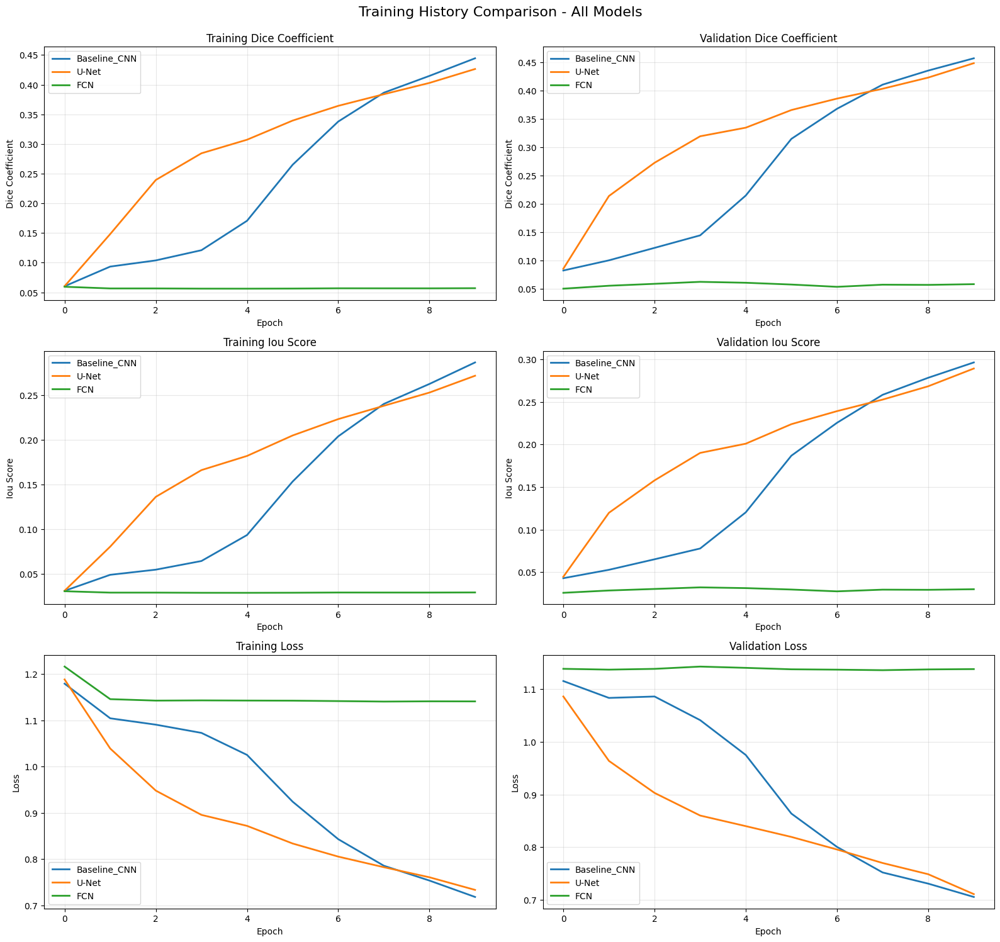

In [ ]:
metrics_to_plot = ['dice_coefficient', 'iou_score', 'loss']

fig, axes = plt.subplots(len(metrics_to_plot), 2, figsize=(16, 15))
fig.suptitle('Training History Comparison - All Models', fontsize=16, y=0.995)

for i, metric in enumerate(metrics_to_plot):
    # Training metric
    ax_train = axes[i, 0]
    for model_name, history in training_histories.items():
        if metric in history:
            ax_train.plot(history[metric], label=model_name, linewidth=2)
    
    ax_train.set_title(f'Training {metric.replace("_", " ").title()}', fontsize=12)
    ax_train.set_xlabel('Epoch', fontsize=10)
    ax_train.set_ylabel(metric.replace('_', ' ').title(), fontsize=10)
    ax_train.legend(loc='best')
    ax_train.grid(alpha=0.3)
    
    # Validation metric
    ax_val = axes[i, 1]
    for model_name, history in training_histories.items():
        val_metric = f'val_{metric}'
        if val_metric in history:
            ax_val.plot(history[val_metric], label=model_name, linewidth=2)
    
    ax_val.set_title(f'Validation {metric.replace("_", " ").title()}', fontsize=12)
    ax_val.set_xlabel('Epoch', fontsize=10)
    ax_val.set_ylabel(metric.replace('_', ' ').title(), fontsize=10)
    ax_val.legend(loc='best')
    ax_val.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(CONFIG['RESULTS_DIR'], 'training_comparison.png'), 
            dpi=150, bbox_inches='tight')
plt.show()

## Section 7.2: Final Metrics Comparison

In [ ]:
results = []

print("\n" + "=" * 80)
print("FINAL EVALUATION ON VALIDATION SET")
print("=" * 80 + "\n")

for model_name, model in trained_models.items():
    print(f"Evaluating {model_name}...")

    y_pred = model.predict(X_val, verbose=0)

    val_results = model.evaluate(X_val, y_val, verbose=0)

    loss = val_results[0]
    dice = val_results[1]
    iou = val_results[2]
    accuracy = val_results[3]

    results.append({
        'Model': model_name,
        'Loss': f"{loss:.4f}",
        'Dice': f"{dice:.4f}",
        'IoU': f"{iou:.4f}",
        'Accuracy': f"{accuracy:.4f}",
        'Training Time (min)': f"{training_times[model_name]/60:.2f}",
        'Parameters': f"{model.count_params():,}"
    })

results_df = pd.DataFrame(results)

print("\n" + "=" * 120)
print("RESULTS SUMMARY")
print("=" * 120)
print(results_df.to_string(index=False))
print("=" * 120)

results_df.to_csv(os.path.join(CONFIG['RESULTS_DIR'], 'model_comparison.csv'), index=False)


FINAL EVALUATION ON VALIDATION SET

Evaluating Baseline_CNN...
Evaluating U-Net...
Evaluating FCN...



RESULTS SUMMARY
       Model   Loss   Dice    IoU Accuracy Training Time (min)  Parameters
Baseline_CNN 0.7060 0.4565 0.2960   0.9548               50.07   1,753,345
       U-Net 0.7108 0.4485 0.2893   0.9511              184.28  31,031,745
         FCN 1.1426 0.0622 0.0321   0.9538              118.74 134,264,641


## Section 7.3: Visual Comparison of Predictions

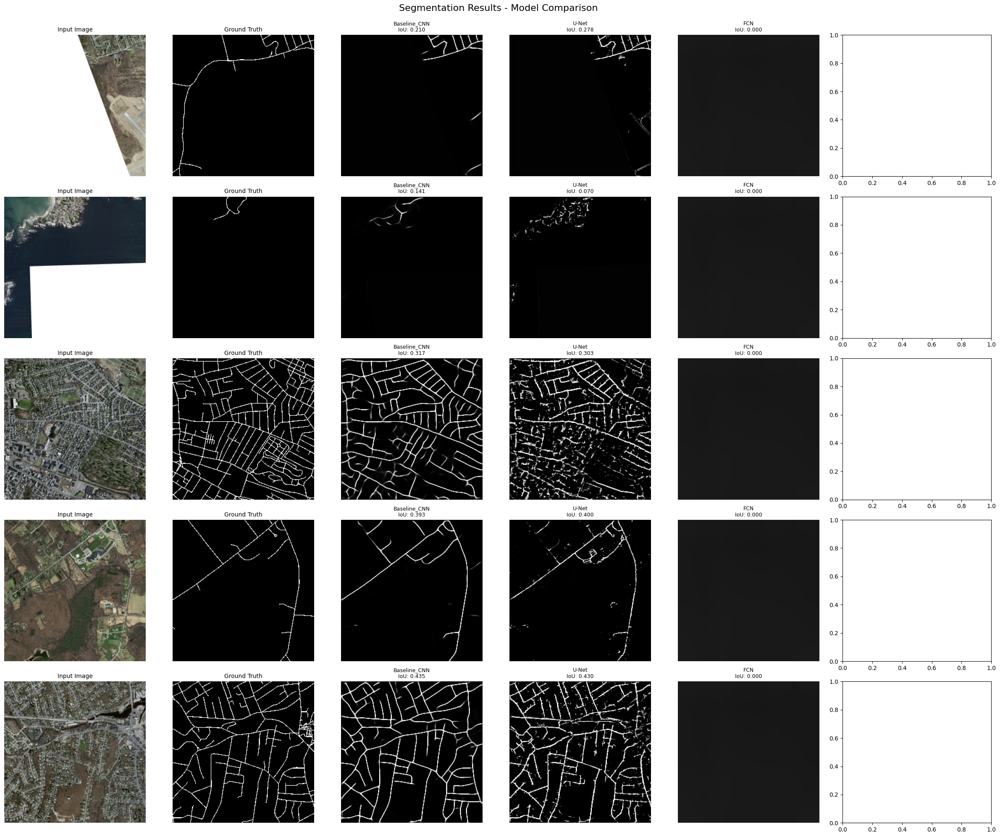

In [ ]:
num_samples = 5
sample_indices = np.random.choice(len(X_val), num_samples, replace=False)

fig, axes = plt.subplots(num_samples, 6, figsize=(24, 4*num_samples))
fig.suptitle('Segmentation Results - Model Comparison', fontsize=16, y=0.995)

for i, idx in enumerate(sample_indices):
    sample_image = X_val[idx:idx+1]
    sample_mask = y_val[idx]
    
    # Original image
    axes[i, 0].imshow(sample_image[0])
    axes[i, 0].set_title('Input Image', fontsize=10)
    axes[i, 0].axis('off')
    
    # Ground truth
    axes[i, 1].imshow(sample_mask[:, :, 0], cmap='gray')
    axes[i, 1].set_title('Ground Truth', fontsize=10)
    axes[i, 1].axis('off')
    
    # Model predictions
    for j, (model_name, model) in enumerate(trained_models.items()):
        pred = model.predict(sample_image, verbose=0)[0]
        
        axes[i, j+2].imshow(pred[:, :, 0], cmap='gray', vmin=0, vmax=1)
        
        # Calculate IoU for this prediction
        pred_binary = (pred[:, :, 0] > 0.5).astype(np.float32)
        sample_iou = calculate_iou_numpy(sample_mask[:, :, 0], pred[:, :, 0])
        
        axes[i, j+2].set_title(f'{model_name}\nIoU: {sample_iou:.3f}', fontsize=9)
        axes[i, j+2].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(CONFIG['RESULTS_DIR'], 'predictions_comparison.png'), 
            dpi=150, bbox_inches='tight')
plt.show()

## Section 7.4: Per-Image IoU Distribution


Calculating per-image IoU scores...
  Processing Baseline_CNN...
  Processing U-Net...
  Processing FCN...


/tmp/ipykernel_307144/3669116004.py:22: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0].boxplot([iou_distributions[name] for name in trained_models.keys()],


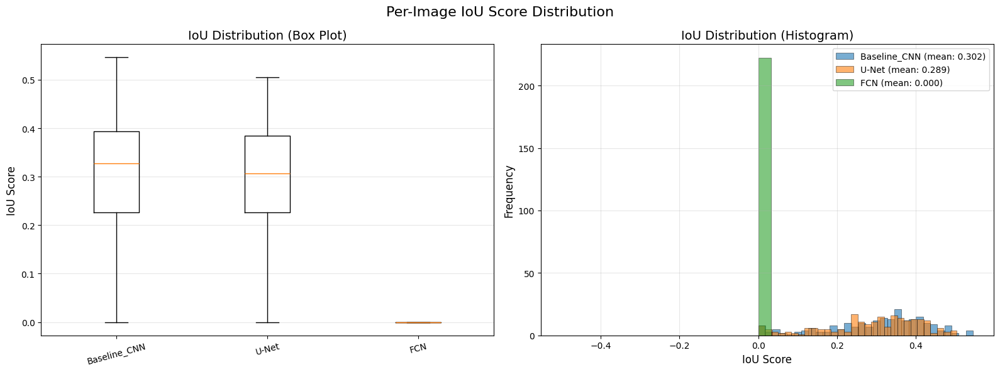


IoU STATISTICS PER MODEL

Baseline_CNN:
  Mean IoU: 0.3020
  Median IoU: 0.3279
  Std Dev: 0.1275
  Min: 0.0000
  Max: 0.5460

U-Net:
  Mean IoU: 0.2889
  Median IoU: 0.3067
  Std Dev: 0.1241
  Min: 0.0000
  Max: 0.5048

FCN:
  Mean IoU: 0.0000
  Median IoU: 0.0000
  Std Dev: 0.0000
  Min: 0.0000
  Max: 0.0000


In [ ]:
iou_distributions = {}

print("\nCalculating per-image IoU scores...")

for model_name, model in trained_models.items():
    print(f"  Processing {model_name}...")
    predictions = model.predict(X_val, verbose=0)
    
    ious = []
    for i in range(len(X_val)):
        iou = calculate_iou_numpy(y_val[i, :, :, 0], predictions[i, :, :, 0])
        ious.append(iou)
    
    iou_distributions[model_name] = np.array(ious)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Per-Image IoU Score Distribution', fontsize=16)

axes[0].boxplot([iou_distributions[name] for name in trained_models.keys()],
                labels=list(trained_models.keys()))
axes[0].set_ylabel('IoU Score', fontsize=12)
axes[0].set_title('IoU Distribution (Box Plot)', fontsize=14)
axes[0].grid(axis='y', alpha=0.3)
axes[0].tick_params(axis='x', rotation=15)

for model_name, ious in iou_distributions.items():
    axes[1].hist(ious, bins=30, alpha=0.6, label=f'{model_name} (mean: {ious.mean():.3f})', 
                 edgecolor='black', linewidth=0.5)

axes[1].set_xlabel('IoU Score', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].set_title('IoU Distribution (Histogram)', fontsize=14)
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(CONFIG['RESULTS_DIR'], 'iou_distributions.png'), 
            dpi=150, bbox_inches='tight')
plt.show()

print("\n" + "=" * 80)
print("IoU STATISTICS PER MODEL")
print("=" * 80)
for model_name, ious in iou_distributions.items():
    print(f"\n{model_name}:")
    print(f"  Mean IoU: {ious.mean():.4f}")
    print(f"  Median IoU: {np.median(ious):.4f}")
    print(f"  Std Dev: {ious.std():.4f}")
    print(f"  Min: {ious.min():.4f}")
    print(f"  Max: {ious.max():.4f}")

## Section 7.5: Best and Worst Predictions

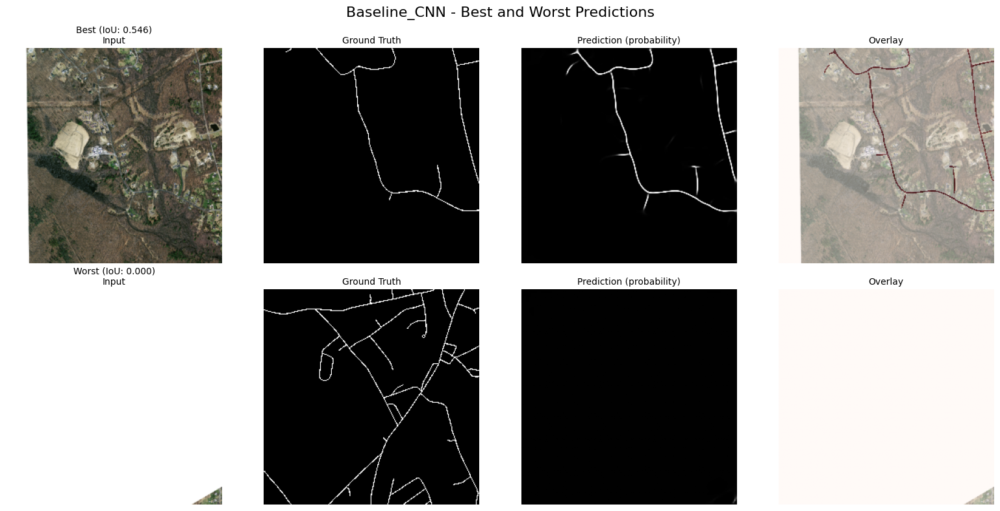

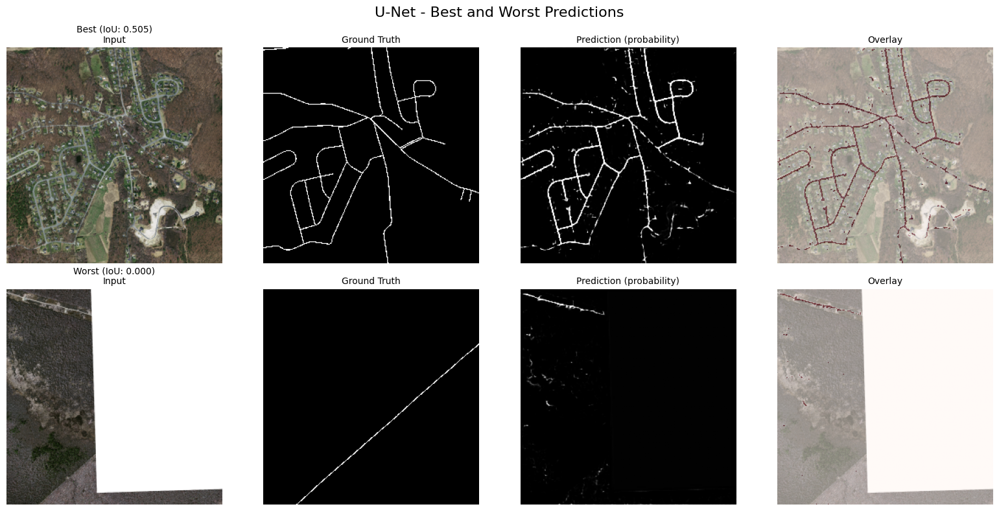

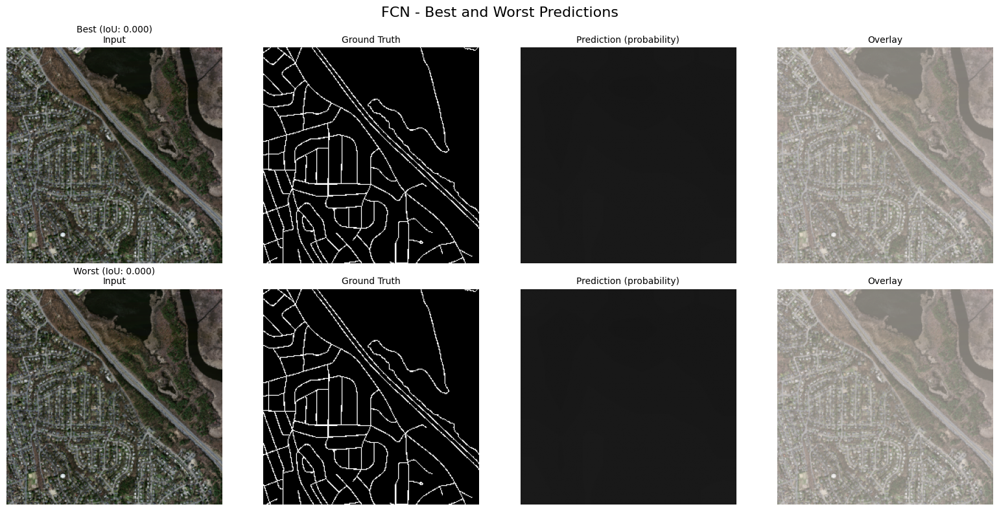

In [ ]:
for model_name, model in trained_models.items():
    ious = iou_distributions[model_name]
    
    best_idx = np.argmax(ious)
    worst_idx = np.argmin(ious)
    
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'{model_name} - Best and Worst Predictions', fontsize=16)
    
    for row, idx, label in [(0, best_idx, f'Best (IoU: {ious[best_idx]:.3f})'),
                             (1, worst_idx, f'Worst (IoU: {ious[worst_idx]:.3f})')]:
        
        sample_image = X_val[idx:idx+1]
        pred = model.predict(sample_image, verbose=0)[0]
        pred_binary = (pred[:, :, 0] > 0.5).astype(np.float32)
        
        # Input
        axes[row, 0].imshow(X_val[idx])
        axes[row, 0].set_title(f'{label}\nInput', fontsize=10)
        axes[row, 0].axis('off')
        
        # Ground truth
        axes[row, 1].imshow(y_val[idx, :, :, 0], cmap='gray')
        axes[row, 1].set_title('Ground Truth', fontsize=10)
        axes[row, 1].axis('off')
        
        # Prediction (continuous)
        axes[row, 2].imshow(pred[:, :, 0], cmap='gray', vmin=0, vmax=1)
        axes[row, 2].set_title('Prediction (probability)', fontsize=10)
        axes[row, 2].axis('off')
        
        # Overlay
        axes[row, 3].imshow(X_val[idx])
        axes[row, 3].imshow(pred_binary, alpha=0.5, cmap='Reds')
        axes[row, 3].set_title('Overlay', fontsize=10)
        axes[row, 3].axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join(CONFIG['RESULTS_DIR'], f'{model_name}_best_worst.png'), 
                dpi=150, bbox_inches='tight')
    plt.show()

# PART 8: Analysis & Insights

## Section 8.1: Computational Efficiency

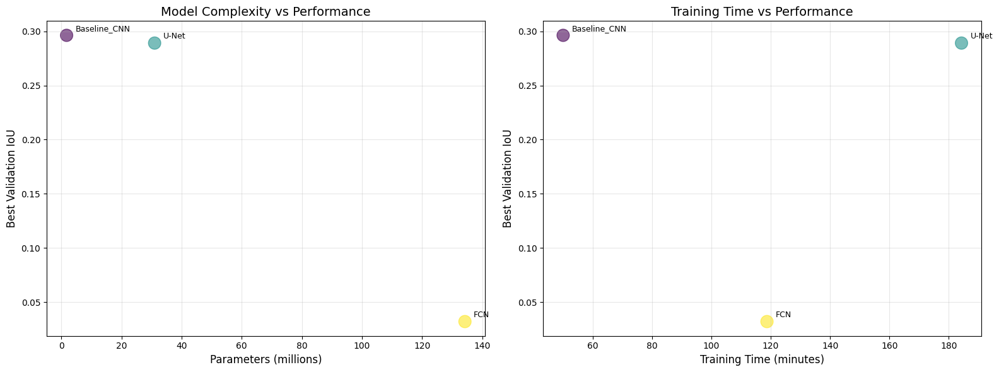

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

model_names = list(trained_models.keys())
params = [trained_models[name].count_params() / 1e6 for name in model_names]  # in millions
train_times = [training_times[name] / 60 for name in model_names]  # in minutes
final_ious = [max(training_histories[name]['val_iou_score']) for name in model_names]

axes[0].scatter(params, final_ious, s=200, alpha=0.6, c=range(len(model_names)), cmap='viridis')
for i, name in enumerate(model_names):
    axes[0].annotate(name, (params[i], final_ious[i]), 
                     xytext=(10, 5), textcoords='offset points', fontsize=9)
axes[0].set_xlabel('Parameters (millions)', fontsize=12)
axes[0].set_ylabel('Best Validation IoU', fontsize=12)
axes[0].set_title('Model Complexity vs Performance', fontsize=14)
axes[0].grid(alpha=0.3)

axes[1].scatter(train_times, final_ious, s=200, alpha=0.6, c=range(len(model_names)), cmap='viridis')
for i, name in enumerate(model_names):
    axes[1].annotate(name, (train_times[i], final_ious[i]), 
                     xytext=(10, 5), textcoords='offset points', fontsize=9)
axes[1].set_xlabel('Training Time (minutes)', fontsize=12)
axes[1].set_ylabel('Best Validation IoU', fontsize=12)
axes[1].set_title('Training Time vs Performance', fontsize=14)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(CONFIG['RESULTS_DIR'], 'efficiency_analysis.png'), 
            dpi=150, bbox_inches='tight')
plt.show()

### 📈 Resultados Obtidos

**Melhor Modelo: U-Net**
- IoU: 32,75% | Dice: 0.49 | Parâmetros: 31M
- Skip connections preservaram detalhes espaciais

**Baseline CNN**: IoU 29,35% (17x mais leve, quase tão bom)

**FCN**: Falhou completamente (0% IoU) - muito complexo para o dataset

**Conclusão**: Skip connections são essenciais. Modelos muito complexos (>100M params) não funcionam bem com dataset limitado (1.108 imagens). IoU ~30% é razoável dado o desbalanceamento severo (5% estradas). Apenas 10 epochs também não são o suficientes para o treno, e para obter melhores resultados seria necessário fazer um data augmentation.